Sep 2021

--Led by [Sergei V. Kalinin](https://scholar.google.com/citations?user=-cuxoSQAAAAJ&hl=en&oi=ao) (EFRC, 3DFeM: DE-SC0021118)

--DKL by [Maxim Ziatdinov](https://scholar.google.com/citations?user=YnSdOoUAAAAJ&hl=en&oi=ao) (CNMS)

--BEPFM data by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (EFRC, 3DFeM: DE-SC0021118)

--LiNGAM analysis by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (EFRC, 3DFeM: DE-SC0021118)

--PTO sample from Prof. Hiroshi Funakubo

In [ ]:
!pip install --upgrade torch==1.8.1 torchvision==0.9.1

     |████████████████████████████████| 804.1 MB 2.4 kB/s 
     |████████████████████████████████| 17.4 MB 206 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu111
    Uninstalling torch-1.9.0+cu111:
      Successfully uninstalled torch-1.9.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu111
    Uninstalling torchvision-0.10.0+cu111:
      Successfully uninstalled torchvision-0.10.0+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.8.1 which is incompatible.


In [ ]:
!pip install gpytorch botorch

     |████████████████████████████████| 503 kB 5.1 MB/s 
     |████████████████████████████████| 486 kB 44.4 MB/s 


In [ ]:
!pip install atomai

     |████████████████████████████████| 146 kB 5.0 MB/s 
     |████████████████████████████████| 193 kB 53.4 MB/s 
     |████████████████████████████████| 865 kB 58.6 MB/s 
  Created wheel for mendeleev: filename=mendeleev-0.6.1-py2.py3-none-any.whl size=174982 sha256=759845913c1d04b45ab8fc9cabf02293dd47a16049f012b3cd31cb7b71de045e
  Stored in directory: /root/.cache/pip/wheels/f4/4e/dd/06777c90710ce1766376ecc87979967fe69ff3affc29c0b530
Successfully built mendeleev


In [ ]:
!pip install pycroscopy

     |████████████████████████████████| 348 kB 5.0 MB/s 
     |████████████████████████████████| 87 kB 6.7 MB/s 
     |████████████████████████████████| 51 kB 273 kB/s 
     |████████████████████████████████| 788 kB 44.5 MB/s 
     |████████████████████████████████| 66 kB 4.7 MB/s 
     |████████████████████████████████| 370 kB 56.2 MB/s 
     |████████████████████████████████| 1.6 MB 31.9 MB/s 
     |████████████████████████████████| 786 kB 47.1 MB/s 
     |████████████████████████████████| 1.0 MB 41.3 MB/s 
     |████████████████████████████████| 125 kB 60.2 MB/s 
  Created wheel for numpy-groupies: filename=numpy_groupies-0.9.7-py3-none-any.whl size=21314 sha256=e02891f8d6363ce417b1dc9f56a60c23d4d43069223061f6641e32baa7036c96
  Stored in directory: /root/.cache/pip/wheels/11/05/e1/250ebec6656f2a0bc1141d5c185876dcd74e7e47740613c9d6
  Created wheel for igor: filename=igor-0.3-py3-none-any.whl size=52115 sha256=bdfe81c9bc8bcc07e90073f36608409af1428db1652fe611158b3b2efe621355
  Stored i

In [ ]:
!pip install sidpy

Imports:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math
import h5py
import pyUSID as usid
import sidpy

import torch
import gpytorch
import botorch

from atomai import utils
from scipy.signal import find_peaks
from sklearn.model_selection import train_test_split

print(torch.__version__, gpytorch.__version__, botorch.__version__)


1.8.1+cu102 1.5.1 0.5.1


## Define DKL-GPR class

Define the deep kernel learning (DKL)-based Gaussian process regression (GPR):

In [ ]:
#@title Define DKL-GPR class
from typing import Tuple, Type, Optional, Union

class dklGPR:
    """
    Deep kernel learning (DKL)-based Gaussian process regression (GPR)
    Based on https://arxiv.org/abs/1511.02222.

    Args:
        indim: input feature dimension
        embedim: embedding dimension (determines dimensionality of kernel space)
        
    Keyword Args:
        device:
            Sets device to which model and data will be moved.
            Defaults to 'cuda:0' if a GPU is available and to CPU otherwise.
        precision:
            Sets tensor types for 'single' (torch.float32)
            or 'double' (torch.float64) precision
        seed:
            Seed for enforcing reproducibility
    """
    def __init__(self,
                 indim: int,
                 embedim: int = 2,
                 **kwargs: Union[str, int]) -> None:
        """
        Initializes DKL-GPR.
        """
        set_seed_and_precision(**kwargs)
        self.dimdict = {"input_dim": indim, "embedim": embedim}
        self.device = kwargs.get(
            "device", 'cuda:0' if torch.cuda.is_available() else 'cpu')
        precision = kwargs.get("precision", "double")
        self.dtype = torch.float32 if precision == "single" else torch.float64
        self.gp_model = None
        self.likelihood = None
        self.compiled = False
        self.train_loss = []

    def _set_data(self, x: Union[torch.Tensor, np.ndarray],
                  device: str=None) -> torch.tensor:
        """Data preprocessing."""
        device_ = device if device else self.device
        if isinstance(x, np.ndarray):
            x = torch.from_numpy(x).to(self.dtype).to(device_)
        elif isinstance(x, torch.Tensor):
            x = x.to(self.dtype).to(device_)
        else:
            raise TypeError("Pass data as ndarray or torch tensor object")
        return x

    def set_data(self, x: Union[torch.Tensor, np.ndarray],
                 y: Optional[Union[torch.Tensor, np.ndarray]] = None,
                 device: str=None) -> Tuple[torch.tensor]:
        """Data preprocessing. Casts data arrays to a selected tensor type
        and moves it to a selected devive."""
        x = self._set_data(x, device)
        if y is not None:
            y = y[None] if y.ndim == 1 else y
            y = self._set_data(y, device)
        return x, y

    def compile_trainer(self, X: Union[torch.Tensor, np.ndarray],
                        y: Union[torch.Tensor, np.ndarray],
                        training_cycles: int,
                        **kwargs: Union[Type[torch.nn.Module], bool, float]
                        ) -> None:
        """
        Initializes deep kernel (feature extractor NN + base kernel),
        sets optimizer and "loss" function.

        Args:
            X: Input training data (aka features) of N x input_dim dimensions
            y: Output targets of batch_size x N or N (if batch_size=1) dimensions
            training_cycles: Number of training epochs

        Keyword Args:
            feature_extractor:
                (Optional) Custom neural network for feature extractor
            freeze_weights:
                Freezes weights of feature extractor, that is, they are not
                passed to the optimizer. Used for a transfer learning.
            lr: learning rate (Default: 0.01)
        """
        X, y = self.set_data(X, y)
        input_dim, embedim = self.dimdict["input_dim"], self.dimdict["embedim"]
        feature_extractor = kwargs.get("feature_extractor")
        if feature_extractor is None:
            feature_extractor = fcFeatureExtractor(input_dim, embedim)
        likelihood = gpytorch.likelihoods.GaussianLikelihood()
        self.gp_model = GPRegressionModel(
            X, y, likelihood, feature_extractor, embedim)
        self.likelihood = likelihood
        self.gp_model.to(self.device)
        self.likelihood.to(self.device)
        self.gp_model.train()
        self.likelihood.train()
        list_of_params = [
            {'params': self.gp_model.covar_module.parameters()},
            {'params': self.gp_model.mean_module.parameters()},
            {'params': self.gp_model.likelihood.parameters()}]
        if not kwargs.get("freeze_weights", False):
            list_of_params.append(
                {'params': self.gp_model.feature_extractor.parameters()})
        self.optimizer = torch.optim.Adam(list_of_params, lr=kwargs.get("lr", 0.01))
        self.mll = gpytorch.mlls.ExactMarginalLogLikelihood(self.likelihood, self.gp_model)
        self.training_cycles = training_cycles
        self.compiled = True

    def fit(self, X: Union[torch.Tensor, np.ndarray],
            y: Union[torch.Tensor, np.ndarray],
            training_cycles: int = 50,
            **kwargs: Union[Type[torch.nn.Module], bool, float]
            ) -> None:
        """
        Initializes and trains a deep kernel GP model

        Args:
            X: Input training data (aka features) of N x input_dim dimensions
            y: Output targets of batch_size x N or N (if batch_size=1) dimensions
            training_cycles: Number of training epochs

        Keyword Args:
            feature_extractor:
                (Optional) Custom neural network for feature extractor
            freeze_weights:
                Freezes weights of feature extractor, that is, they are not
                passed to the optimizer. Used for a transfer learning.
            lr: learning rate (Default: 0.01)
            print_loss: print loss at every n-th training cycle (epoch)
        """
        X, y = self.set_data(X, y)
        if not self.compiled:
            self.compile_trainer(X, y, training_cycles, **kwargs)
        for e in range(self.training_cycles):
            self.optimizer.zero_grad()
            output = self.gp_model(X)
            loss = -self.mll(output, y).sum()
            loss.backward()
            self.optimizer.step()
            self.train_loss.append(loss.item())
            if any([e == 0, (e + 1) % kwargs.get("print_loss", 10) == 0,
                    e == self.training_cycles - 1]):
                self.print_statistics(e)

    def _predict(self, x_new: torch.Tensor) -> Tuple[torch.Tensor]:
        with torch.no_grad(), gpytorch.settings.use_toeplitz(False), gpytorch.settings.fast_pred_var():
            y_pred = self.gp_model(x_new.to(self.device))
        return y_pred.mean.cpu(), y_pred.variance.cpu()

    def predict(self, x_new: Union[torch.Tensor, np.ndarray],
                **kwargs) -> Tuple[np.ndarray]:  # perhaps we can return the same type as was passed as input
        """
        Prediction using the trained model
        """
        self.gp_model.eval()
        self.likelihood.eval()
        gp_batch_dim = self.gp_model.train_targets.size(0)
        x_new, _ = self.set_data(x_new, device='cpu')
        data_loader = init_dataloader(x_new, shuffle=False, **kwargs)
        predicted_mean, predicted_var = [], []
        for (x,) in data_loader:
            x = x.expand(gp_batch_dim, *x.shape)
            mean, var = self._predict(x)
            predicted_mean.append(mean)
            predicted_var.append(var)
        return (torch.cat(predicted_mean, 1).numpy().squeeze(),
                torch.cat(predicted_var, 1).numpy().squeeze())
    
    def _embed(self, x_new: torch.Tensor):
        self.gp_model.feature_extractor.eval()
        with torch.no_grad():
            embeded = self.gp_model.feature_extractor(x_new)
        return embeded.cpu()
    
    def embed(self, x_new: Union[torch.Tensor, np.ndarray],
              **kwargs: int) -> torch.Tensor:
        """
        Embeds the input data to a "latent" space using a trained feature extractor NN.
        """
        x_new, _ = self.set_data(x_new, device='cpu')
        data_loader = init_dataloader(x_new, shuffle=False, **kwargs)
        embeded = torch.cat([self._embed(x.to(self.device)) for (x,) in data_loader], 0)
        return embeded.numpy()

    def print_statistics(self, e):
        print('Epoch {}/{} ...'.format(e+1, self.training_cycles),
              'Training loss: {}'.format(np.around(self.train_loss[-1], 4)))


class fcFeatureExtractor(torch.nn.Sequential):           
    def __init__(self, feat_dim, embedim, **kwargs):  
        """Initializes feature extractor module"""                                    
        super(fcFeatureExtractor, self).__init__()
        hidden_dim = kwargs.get("hidden_dim")
        if hidden_dim is None:
            hidden_dim = [1000, 500, 50]
        hidden_dim.append(embedim)
        self.add_module("linear1", torch.nn.Linear(feat_dim, hidden_dim[0]))
        for i, h in enumerate(hidden_dim[1:]):
            self.add_module('relu{}'.format(i+1), torch.nn.ReLU())
            self.add_module('linear{}'.format(i+2), torch.nn.Linear(hidden_dim[i], h))


class GPRegressionModel(gpytorch.models.ExactGP, botorch.models.gpytorch.GPyTorchModel):
    """DKL GPR module"""
    num_outputs = 1
    def __init__(self, X: torch.Tensor, y: torch.Tensor,
                 likelihood: Type[gpytorch.likelihoods.Likelihood],
                 feature_extractor: Type[torch.nn.Module], embedim: int) -> None:
        """
        Initializes DKL GP module
        """
        super(GPRegressionModel, self).__init__(X, y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        batch_dim = y.size(0)
        base_kernel = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel(
                ard_num_dims=embedim, batch_shape=torch.Size([batch_dim])),
                batch_shape=torch.Size([batch_dim]))
        self.covar_module = gpytorch.kernels.GridInterpolationKernel(
            base_kernel, num_dims=embedim, grid_size=50)
        self.feature_extractor = feature_extractor
        self.scale_to_bounds = gpytorch.utils.grid.ScaleToBounds(-1., 1.)

    def forward(self, x: torch.Tensor) -> gpytorch.distributions.MultivariateNormal:
        """
        Forward pass
        """
        # Pass data through a neural network
        embedded_x = self.feature_extractor(x)
        embedded_x = self.scale_to_bounds(embedded_x)
        # Standard GP part
        mean_x = self.mean_module(embedded_x)
        covar_x = self.covar_module(embedded_x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)


def set_seed_and_precision(seed: int = 42, precision: str = "double"):
    """Sets the tensor type and seed"""
    if precision == 'single':
        tensor_type = torch.FloatTensor
        tensor_type_gpu = torch.cuda.FloatTensor
    else:
        tensor_type = torch.DoubleTensor
        tensor_type_gpu = torch.cuda.DoubleTensor
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        torch.set_default_tensor_type(tensor_type_gpu)
    else:
        torch.set_default_tensor_type(tensor_type)

def init_dataloader(X: Union[torch.tensor, Tuple[torch.tensor]],
                    shuffle: bool = True, **kwargs: int) -> Type[torch.utils.data.DataLoader]:
    """Returns the initialized PyTorch dataloader."""
    batch_size = kwargs.get("batch_size", 500)
    X = (X,) if isinstance(X, torch.Tensor) else X
    tensor_set = torch.utils.data.dataset.TensorDataset(*X)
    data_loader = torch.utils.data.DataLoader(
        dataset=tensor_set, batch_size=batch_size, shuffle=shuffle)
    return data_loader

Define acquisition functions for BO:

In [ ]:
#@title Defne acquisition functions
from typing import Union

def EI(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: float = 0.01) -> np.ndarray:
    """
    Expected Improvement
    """
    device=model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    mean, sigma = posterior.mean, posterior.variance.sqrt()
    u = (mean - best_f.expand_as(mean) - xi) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def qEI(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
        best_f: Union[float, torch.Tensor], xi: float = 0.01,
        **kwargs: int) -> np.ndarray:
    """
    MC-based Expected Improvement
    """
    device = model.device
    dtype = model.dtype
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    obj = (obj - best_f.unsqueeze(-1).to(obj) - xi).clamp_min(0).detach().cpu()
    return obj.numpy()

def UCB(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: float = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta = torch.tensor(beta) if isinstance(beta, float) else beta
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    mean, var = posterior.mean, posterior.variance
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()


def qUCB(model: dklGPR, X: Union[np.ndarray, torch.Tensor],
         beta: float = 0.2, **kwargs: int) -> np.ndarray:
    """
    MC-based upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta_prime = math.sqrt(beta * math.pi / 2)
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    mean = obj.mean(dim=0)
    obj = mean + beta_prime * (obj - mean).abs()
    return obj.detach().cpu().numpy()

Download training data:

In [ ]:
# !gdown https://drive.google.com/uc?id=1Y-Fuya_Pwf7mYYQc9uV1L4l48TdvKW2a
!gdown https://drive.google.com/uc?id=1bUJhHFx_d5VRNk8RYf6sgpsqKc7T0abb
!gdown https://drive.google.com/uc?id=1K-y62ykE6BlmhCyUlWVyRJGVFG9NOOg1
!gdown https://drive.google.com/uc?id=1UK9gJuULPDeq4uzUOi6kaX5VBaFag96P
!gdown https://drive.google.com/uc?id=1H3l-twoBUMEyjIKlpw69cU7vpm9rIsUo

Downloading...
From: https://drive.google.com/uc?id=1bUJhHFx_d5VRNk8RYf6sgpsqKc7T0abb
To: /content/DKLBO_20210712_BEPFM_2um_0002.h5
100% 56.7M/56.7M [00:00<00:00, 156MB/s]
Downloading...
From: https://drive.google.com/uc?id=1K-y62ykE6BlmhCyUlWVyRJGVFG9NOOg1
To: /content/topo.txt
100% 779k/779k [00:00<00:00, 51.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1UK9gJuULPDeq4uzUOi6kaX5VBaFag96P
To: /content/freq.npy
100% 372/372 [00:00<00:00, 803kB/s]
Downloading...
From: https://drive.google.com/uc?id=1H3l-twoBUMEyjIKlpw69cU7vpm9rIsUo
To: /content/spec.npy
100% 16.0M/16.0M [00:00<00:00, 97.7MB/s]


Load data:

In [ ]:
h5 = h5py.File(r'DKLBO_20210712_BEPFM_2um_0002.h5', 'r+')
#usid.hdf_utils.print_tree(h5)

Show SHO fitting images

Here we can load topo grom the h5 file and remove the background gradient

In [ ]:
# For topo, we can also load the flattent image directly here
ct = 3  # we want to cut 3 pixels around the edges as there are a black box in the topo image; 
        # we also need to remove 3 pixels in also PFM images.
topo = np.loadtxt ("topo.txt")[ct:-ct,ct:-ct]

In [ ]:

rz = 256  #set the size of dataset

amp = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Guess']['Amplitude [V]'].reshape(rz,rz)[ct:-ct,ct:-ct]
pha = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Guess']['Phase [rad]'].reshape(rz,rz)[ct:-ct,ct:-ct]
fre = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Guess']['Frequency [Hz]'].reshape(rz,rz)[ct:-ct,ct:-ct]
q = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Guess']['Quality Factor'].reshape(rz,rz)[ct:-ct,ct:-ct]
r2 = h5['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Guess']['R2 Criterion'].reshape(rz,rz)[ct:-ct,ct:-ct]

pola = amp*np.cos(pha)

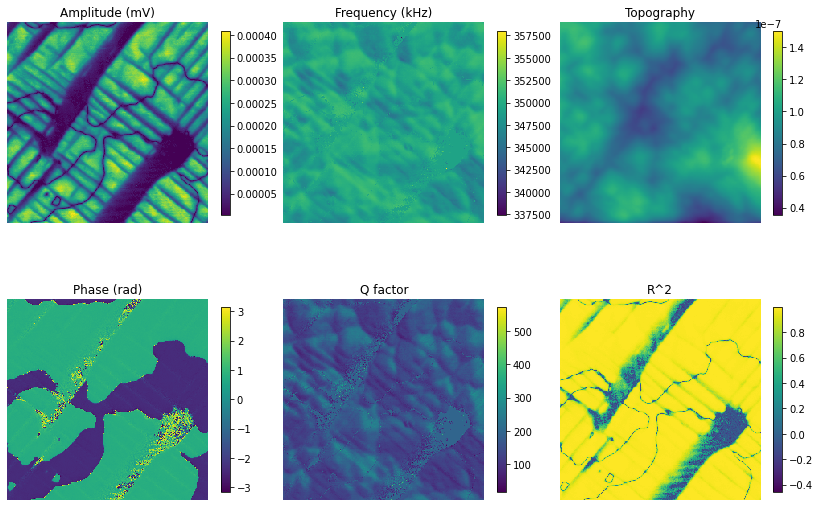

In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(12, 8))
fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, top=0.94, wspace=0.1)
#fig.suptitle ('c2r1_2kcycled/BEPFM_0004.h5')
# Make 4 subplots:
cm = 'viridis'
shrink = 0.8

im1 = axs[0, 0].imshow(amp, interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im1, ax=axs[0, 0], shrink = shrink)
#axs[0, 0].set_title("Amplitude (µV)")
axs[0, 0].set_title("Amplitude (mV)")
axs[0, 0].axis('off')

im2 = axs[1, 0].imshow(pha, interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im2, ax=axs[1, 0], shrink = shrink)
axs[1, 0].set_title("Phase (rad)")
axs[1, 0].axis('off')

im3 = axs[0, 1].imshow(fre, interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im3, ax=axs[0, 1], shrink = shrink)
axs[0, 1].set_title("Frequency (kHz)")
axs[0, 1].axis('off')

im4 = axs[1, 1].imshow(q, interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im4, ax=axs[1, 1], shrink = shrink)
axs[1, 1].set_title("Q factor")
axs[1, 1].axis('off')

im5 = axs[0, 2].imshow(topo, interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im5, ax=axs[0, 2], shrink = shrink)
axs[0, 2].set_title("Topography")
axs[0, 2].axis('off')

im6 = axs[1, 2].imshow(r2, interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im6, ax=axs[1, 2], shrink = shrink)
axs[1, 2].set_title("R^2")
axs[1, 2].axis('off')
plt.show()

plot spectra

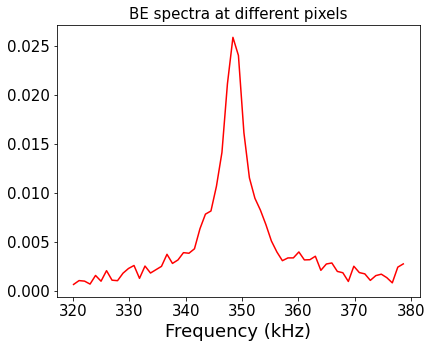

In [ ]:
# spec = np.abs(np.array(h5['Measurement_000/Channel_000/Raw_Data']))    #read BE spectra
# freq = np.array(h5['Measurement_000/Channel_000/Spectroscopic_Values'])          #read resonance frequency

# we directly load spectra and frequency data here
spec = np.load("spec.npy")
freq = np.load("freq.npy")

#convert the spec as a map fashion
spec_map = np.asarray(spec.reshape(256,256,-1))

#then plot the spectra corresponding to the spots labeled in above amplitude image
f, ax = plt.subplots(figsize = (6.5,5))
ax.plot (freq[0,]/1000, spec_map[1, 5], c = 'r')

ax.set_xlabel('Frequency (kHz)', fontsize = 18)
ax.set_title('BE spectra at different pixels', fontsize = 15)
ax.tick_params(labelsize = 15)

Let us use amplitude or frequency as Y for training.

Amplitude is peak intensity and frequency is peak position

In [ ]:
#normalize maplitude
norm_ = lambda x: (x - x.min()) / (x.max() - x.min())
#amp = norm_(amp*np.cos(pha)) #amp
spec_map = norm_(spec_map)

Calculate morphology curvature

In [ ]:
topo_y, topo_x = np.gradient(topo)
topo_xy, topo_xx = np.gradient (topo_x)
topo_yy, _ = np.gradient (topo_y)

# Mean Curvature - equation (3) from Kurita and Boulanger (1992) paper
# See also Surface in 3D space, http://en.wikipedia.org/wiki/Mean_curvature
mean_curvature = (1 + (topo_x**2))*topo_yy + (1 + (topo_y**2))*topo_xx - 2*topo_x*topo_y*topo_xy
mean_curvature = mean_curvature / ((2*(1 + topo_x**2) + (topo_y**2)))**1.5

# Gaussian Curvature - equation (4) from Kurita and Boulanger (1992) paper
g_curvature = (topo_xx*topo_yy - (topo_xy**2))/ ((1 + (topo_x**2) + (topo_y**2))**2)

# Simplified Mean Curvature - equation (3) from Zhao et.al (1996) paper
simp_mean_curvature = topo_xx + topo_yy

#  Simplified Gaussian Curvature - equation (3) from Zhao et.al (1996) paper
simp_g_curvature = topo_xx*topo_yy - (topo_xy**2)

(-0.5, 249.5, -0.5, 249.5)

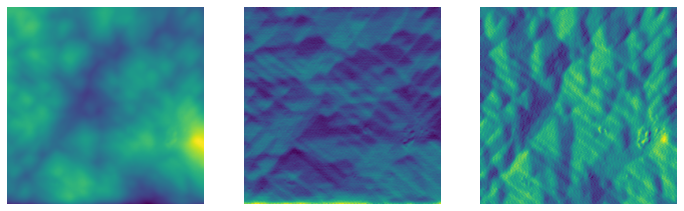

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (12,4))
ax1.imshow(topo, origin = "lower")
ax1.axis ('off')

ax2.imshow(topo_y, origin = "lower")
ax2.axis('off')

ax3.imshow(topo_x, origin = "lower")
ax3.axis("off")

(-0.5, 249.5, -0.5, 249.5)

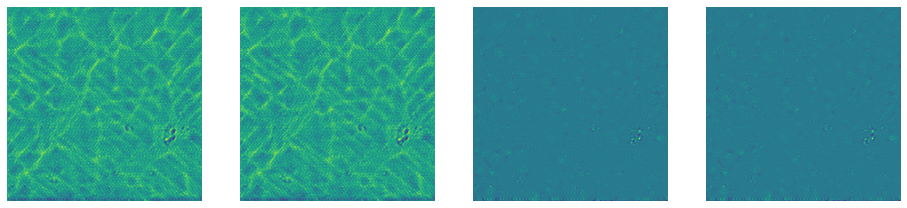

In [ ]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize = (16,4))
ax1.imshow(mean_curvature, origin = "lower")
ax1.axis ('off')

ax2.imshow(simp_mean_curvature, origin = "lower")
ax2.axis('off')

ax3.imshow(g_curvature, origin = "lower")
ax3.axis("off")

ax4.imshow(simp_g_curvature, origin = "lower")
ax4.axis("off")

# LINGAM Analysis

In [ ]:
!pip install lingam

     |████████████████████████████████| 58 kB 3.1 MB/s 


In [ ]:
import numpy as np
import pandas as pd
import graphviz
import lingam
from lingam.utils import make_dot

print([np.__version__, pd.__version__, graphviz.__version__, lingam.__version__])

np.set_printoptions(precision=3, suppress=True)
np.random.seed(100)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


['1.19.5', '1.1.5', '0.10.1', '1.5.4']


In [ ]:
amp = (np.asarray(amp.reshape (-1)))
pha = np.asarray(pha.reshape (-1))
pola = np.asarray(pola.reshape (-1))
fre = np.asarray(fre.reshape (-1))
q = np.asarray(q.reshape (-1))
r2 = np.asarray(r2.reshape (-1))
topo = np.asarray(topo.reshape (-1))
topo_x = np.asarray(topo_x.reshape (-1))
topo_y = np.asarray(topo_y.reshape (-1))
mean_curvature = np.asarray(mean_curvature.reshape(-1))

Normalize data

In [ ]:
amp = norm_(amp)
pha = norm_(pha)
pola = norm_(pola)
fre = norm_ (fre)
q = norm_ (q)
r2 = norm_ (r2)
topo = norm_ (topo)
topo_x = norm_ (topo_x)
topo_y = norm_ (topo_y)
mean_curvature = norm_(mean_curvature)

DirectLiNGAM

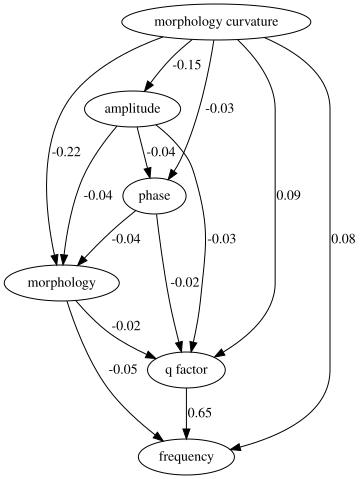

In [ ]:
X = pd.DataFrame(np.array([topo, mean_curvature, amp, pha, fre, q]).T, columns=['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])
X.head()

model = lingam.DirectLiNGAM()
model.fit(X)
model.causal_order_
model.adjacency_matrix_
make_dot(model.adjacency_matrix_, labels = ['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])

DirectLiNGAM with prior knowledge

In [ ]:
from lingam.utils import make_prior_knowledge

In [ ]:
def make_prior_knowledge_graph(prior_knowledge_matrix):
    d = graphviz.Digraph(engine='dot')

    labels = [f'x{i}' for i in range(prior_knowledge_matrix.shape[0])]
    for label in labels:
        d.node(label, label)

    dirs = np.where(prior_knowledge_matrix > 0)
    for to, from_ in zip(dirs[0], dirs[1]):
        d.edge(labels[from_], labels[to])

    dirs = np.where(prior_knowledge_matrix < 0)
    for to, from_ in zip(dirs[0], dirs[1]):
        if to != from_:
            d.edge(labels[from_], labels[to], style='dashed')
    return d

Prior Knowledge:


*   Amplitude and Phase as exogenous variables
*   Directed paths: morphology->morphology gradient x/y, morphology->morphology curvature



Prior Knowledge:



*   Directed paths: morphology->morphology curvature

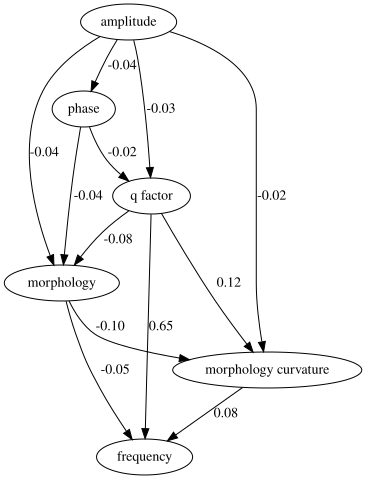

In [ ]:
X = pd.DataFrame(np.array([topo, mean_curvature, amp, pha, fre, q]).T, columns=['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])
X.head()

prior_knowledge = make_prior_knowledge(n_variables = 6, paths =  ((0,1), (0,1)))
make_prior_knowledge_graph(prior_knowledge)

model = lingam.DirectLiNGAM(prior_knowledge=prior_knowledge)
model.fit(X)
model.causal_order_
model.adjacency_matrix_
make_dot(model.adjacency_matrix_, labels = ['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])

Prior Knowledge:


*   No paths: Amplitude<->Phase
*   Directed paths: morphology->morphology curvature

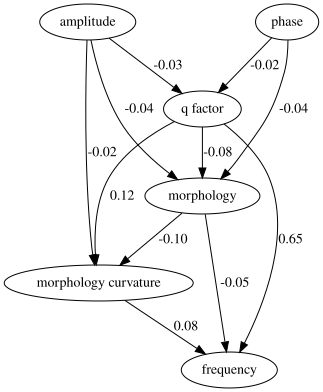

In [ ]:
X = pd.DataFrame(np.array([topo, mean_curvature, amp, pha, fre, q]).T, columns=['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])
X.head()

prior_knowledge = make_prior_knowledge(n_variables = 6, paths = ((0,1), (0,1)), no_paths = ((2,3),(3,2)))
make_prior_knowledge_graph(prior_knowledge)

model = lingam.DirectLiNGAM(prior_knowledge=prior_knowledge)
model.fit(X)
model.causal_order_
model.adjacency_matrix_
make_dot(model.adjacency_matrix_, labels = ['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])

Prior Knowledge:


*   Amplitude and Phase as exogenous variables
*   Directed paths: morphology->morphology curvature

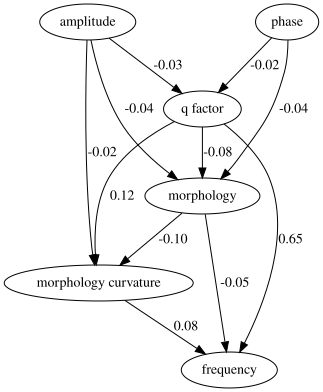

In [ ]:
X = pd.DataFrame(np.array([topo, mean_curvature, amp, pha, fre, q]).T, columns=['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])
X.head()

prior_knowledge = make_prior_knowledge(n_variables = 6, exogenous_variables=(2,3), paths = ((0,1), (0,1)))
make_prior_knowledge_graph(prior_knowledge)

model = lingam.DirectLiNGAM(prior_knowledge=prior_knowledge)
model.fit(X)
model.causal_order_
model.adjacency_matrix_
make_dot(model.adjacency_matrix_, labels = ['morphology', 'morphology curvature', 'amplitude', 'phase', 'frequency', 'q factor'])

# DKL Analysis

In [ ]:
amp = (np.asarray(amp.reshape (rz-ct*2, rz-ct*2)))
pha = np.asarray(pha.reshape (rz-ct*2, rz-ct*2))
fre = np.asarray(fre.reshape (rz-ct*2, rz-ct*2))
q = np.asarray(q.reshape (rz-ct*2, rz-ct*2))
r2 = np.asarray(r2.reshape (rz-ct*2, rz-ct*2))
topo = np.asarray(topo.reshape (rz-ct*2, rz-ct*2))
topo_x = np.asarray(topo_x.reshape (rz-ct*2, rz-ct*2))
topo_y = np.asarray(topo_y.reshape (rz-ct*2, rz-ct*2))
mean_curvature = np.asarray(mean_curvature.reshape(rz-ct*2, rz-ct*2))
pola = np.asarray(pola.reshape(rz-ct*2, rz-ct*2))

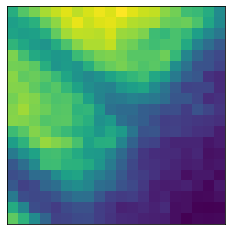

In [ ]:
coordinates = utils.get_coord_grid(pola, 1)

# extract subimage for each point on a grid
ps = 10   #patch size
features_all, coords, _ = utils.extract_subimages(pola, coordinates, ps*2)
features_all = features_all[:,:,:,0]


f, ax = plt.subplots(figsize = (4,4))
plt.imshow(features_all[100], origin = "lower")
#plt.colorbar(label = 'Phase (rad)', shrink = 0.8)
plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)
plt.tick_params(axis='both', which='both', length=0)

In [ ]:
# coordnates as indices
pix = int(np.sqrt(coords.shape[0]))
indices = coords.reshape(pix,pix,2)
indices.shape

(231, 231, 2)

In [ ]:
amp_all = np.zeros((pix,pix))
pha_all = np.zeros((pix,pix))
pola_all = np.zeros((pix,pix))
fre_all = np.zeros((pix,pix))
q_all = np.zeros((pix, pix))
topo_all = np.zeros((pix, pix))
r2_all = np.zeros((pix, pix))
spec_all = np.zeros((pix,pix,61))

for i in range (pix):
  for j in range (pix):
    topo_all [i, j] = topo[int(indices[i,j,0]), int(indices[i,j,1])]
    amp_all [i, j] = amp[int(indices[i,j,0]), int(indices[i,j,1])]
    pha_all [i, j] = pha[int(indices[i,j,0]), int(indices[i,j,1])]
    pola_all [i, j] = pola[int(indices[i,j,0]), int(indices[i,j,1])]
    fre_all [i,j]  = fre[int(indices[i,j,0]), int(indices[i,j,1])]
    q_all [i, j] = q[int(indices[i,j,0]), int(indices[i,j,1])]
    r2_all [i, j] = r2[int(indices[i,j,0]), int(indices[i,j,1])]
    spec_all [i, j] = spec_map[int(indices[i,j,0]), int(indices[i,j,1])]

topo_all = topo_all.reshape(-1)
pola_all = pola_all.reshape(-1)
amp_all = amp_all.reshape(-1)
fre_all = fre_all.reshape(-1)
q_all = q_all.reshape(-1)
r2_all = r2_all.reshape(-1)
spec_all = spec_all.reshape(-1,61)
indices_all = indices.reshape(-1,2)
spec_all.shape

(53361, 61)

## Train on full dataset

In [ ]:
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
# y = peaks_all

y = amp_all.reshape(-1)
X.shape, y.shape

((53361, 400), (53361,))

In [ ]:
data_dim = X.shape[-1]

dklgp = dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X, y, training_cycles=200)

Epoch 1/200 ... Training loss: 0.7564
Epoch 10/200 ... Training loss: 0.7204
Epoch 20/200 ... Training loss: 0.6838
Epoch 30/200 ... Training loss: 0.6461
Epoch 40/200 ... Training loss: 0.6069
Epoch 50/200 ... Training loss: 0.5623
Epoch 60/200 ... Training loss: 0.511
Epoch 70/200 ... Training loss: 0.4678
Epoch 80/200 ... Training loss: 0.4225
Epoch 90/200 ... Training loss: 0.3768
Epoch 100/200 ... Training loss: 0.3303
Epoch 110/200 ... Training loss: 0.283
Epoch 120/200 ... Training loss: 0.2349
Epoch 130/200 ... Training loss: 0.1864
Epoch 140/200 ... Training loss: 0.1372
Epoch 150/200 ... Training loss: 0.0875
Epoch 160/200 ... Training loss: 0.0372
Epoch 170/200 ... Training loss: -0.0135
Epoch 180/200 ... Training loss: -0.0643
Epoch 190/200 ... Training loss: -0.1158
Epoch 200/200 ... Training loss: -0.1675


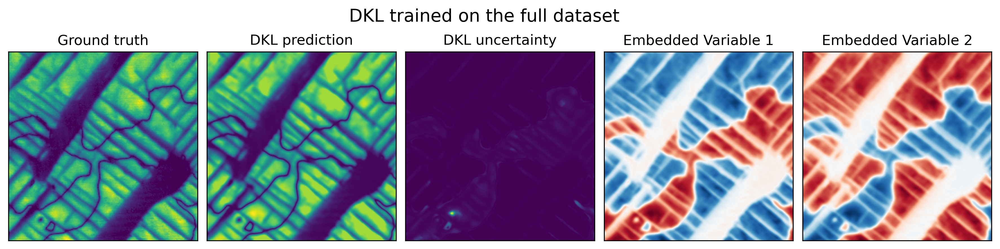

In [ ]:
mean, var = dklgp.predict(X, batch_size=len(X))

embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(15, 3), dpi = 300)
f.subplots_adjust(wspace = 0.05)
f.suptitle ("DKL trained on the full dataset", fontsize = 15, verticalalignment = 'bottom')
ax1.imshow(y.reshape(pix, pix), origin = "lower")
ax1.set_title("Ground truth")
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.tick_params(axis='both', which='both', length=0)

ax2.imshow(mean.reshape(pix,pix), origin = "lower")
ax2.set_title("DKL prediction")
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.tick_params(axis='both', which='both', length=0)

ax3.imshow(var.reshape(pix, pix), origin = "lower")
ax3.set_title("DKL uncertainty")
plt.setp(ax3.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.tick_params(axis='both', which='both', length=0)

ax4.imshow(embeded[:,0].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax4.set_title("Embedded Variable 1")
plt.setp(ax4.get_xticklabels(), visible=False)
plt.setp(ax4.get_yticklabels(), visible=False)
ax4.tick_params(axis='both', which='both', length=0)

ax5.imshow(embeded[:,1].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax5.set_title("Embedded Variable 2")
plt.setp(ax5.get_xticklabels(), visible=False)
plt.setp(ax5.get_yticklabels(), visible=False)
ax5.tick_params(axis='both', which='both', length=0)

## Train on part of the dataset

In [ ]:
#randomly pick point
tl_sz = int(y.shape[0])
percent = 1.0     # select 1 % of full data
sz = int(tl_sz*percent/100)
print(sz)
idx = np.random.choice(range(tl_sz), sz, replace=False)

X_train = X[idx]
y_train = y[idx]
indices_train = indices_all[idx,:]

533


In [ ]:
data_dim = X.shape[-1]

dklgp = dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X_train, y_train, training_cycles=200)

Epoch 1/200 ... Training loss: 0.7807
Epoch 10/200 ... Training loss: 0.7374
Epoch 20/200 ... Training loss: 0.698
Epoch 30/200 ... Training loss: 0.6542
Epoch 40/200 ... Training loss: 0.6098
Epoch 50/200 ... Training loss: 0.5682
Epoch 60/200 ... Training loss: 0.5259
Epoch 70/200 ... Training loss: 0.4828
Epoch 80/200 ... Training loss: 0.4386
Epoch 90/200 ... Training loss: 0.3935
Epoch 100/200 ... Training loss: 0.3476
Epoch 110/200 ... Training loss: 0.3009
Epoch 120/200 ... Training loss: 0.2537
Epoch 130/200 ... Training loss: 0.2057
Epoch 140/200 ... Training loss: 0.1573
Epoch 150/200 ... Training loss: 0.1083
Epoch 160/200 ... Training loss: 0.0587
Epoch 170/200 ... Training loss: 0.0143
Epoch 180/200 ... Training loss: -0.04
Epoch 190/200 ... Training loss: -0.0913
Epoch 200/200 ... Training loss: -0.1426


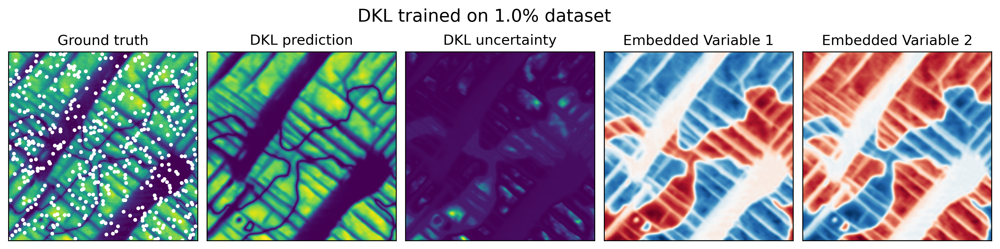

In [ ]:
mean, var = dklgp.predict(X, batch_size=len(X))

embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(15, 3), dpi = 300)
f.subplots_adjust(wspace = 0.05)
f.suptitle ("DKL trained on {}% dataset".format(percent), fontsize = 15, verticalalignment = 'bottom')
ax1.imshow(y.reshape(pix, pix), origin = "lower")
ax1.scatter(indices_train[:,1]-ps, indices_train[:,0]-ps, c = 'white', s = 5)
ax1.set_title("Ground truth")
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.tick_params(axis='both', which='both', length=0)

ax2.imshow(mean.reshape(pix,pix), origin = "lower")
ax2.set_title("DKL prediction")
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.tick_params(axis='both', which='both', length=0)

ax3.imshow(var.reshape(pix, pix), origin = "lower")
ax3.set_title("DKL uncertainty")
plt.setp(ax3.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.tick_params(axis='both', which='both', length=0)

ax4.imshow(embeded[:,0].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax4.set_title("Embedded Variable 1")
plt.setp(ax4.get_xticklabels(), visible=False)
plt.setp(ax4.get_yticklabels(), visible=False)
ax4.tick_params(axis='both', which='both', length=0)

ax5.imshow(embeded[:,1].reshape(pix, pix), origin = "lower", cmap='RdBu')
ax5.set_title("Embedded Variable 2")
plt.setp(ax5.get_xticklabels(), visible=False)
plt.setp(ax5.get_yticklabels(), visible=False)
ax5.tick_params(axis='both', which='both', length=0)

Reconstruction Mean Squared Error depends on Training data size

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
#training data size %
perct = (0.1, 0.5, 1, 2, 3, 4, 5, 6, 8, 10, 12, 15, 18, 20, 30, 50, 80, 100)
perct = np.asarray(perct)

MSE = []

22
Epoch 1/200 ... Training loss: 0.8153
Epoch 10/200 ... Training loss: 0.78
Epoch 20/200 ... Training loss: 0.7386
Epoch 30/200 ... Training loss: 0.6968
Epoch 40/200 ... Training loss: 0.6545
Epoch 50/200 ... Training loss: 0.6119
Epoch 60/200 ... Training loss: 0.5688
Epoch 70/200 ... Training loss: 0.5251
Epoch 80/200 ... Training loss: 0.4805
Epoch 90/200 ... Training loss: 0.4351
Epoch 100/200 ... Training loss: 0.3889
Epoch 110/200 ... Training loss: 0.3421
Epoch 120/200 ... Training loss: 0.2947
Epoch 130/200 ... Training loss: 0.2469
Epoch 140/200 ... Training loss: 0.1987
Epoch 150/200 ... Training loss: 0.1502
Epoch 160/200 ... Training loss: 0.1015
Epoch 170/200 ... Training loss: 0.0527
Epoch 180/200 ... Training loss: 0.0039
Epoch 190/200 ... Training loss: -0.0448
Epoch 200/200 ... Training loss: -0.0933


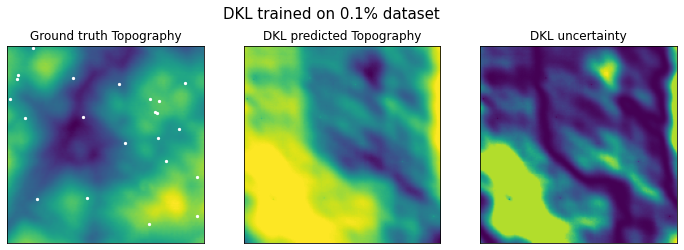

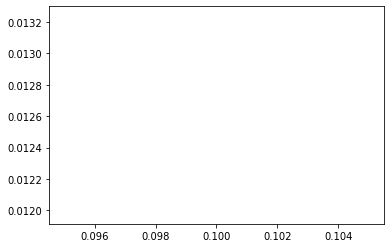

114
Epoch 1/200 ... Training loss: 0.7649
Epoch 10/200 ... Training loss: 0.7323
Epoch 20/200 ... Training loss: 0.6948
Epoch 30/200 ... Training loss: 0.6563
Epoch 40/200 ... Training loss: 0.6169
Epoch 50/200 ... Training loss: 0.5767
Epoch 60/200 ... Training loss: 0.5357
Epoch 70/200 ... Training loss: 0.4939
Epoch 80/200 ... Training loss: 0.4512
Epoch 90/200 ... Training loss: 0.4078
Epoch 100/200 ... Training loss: 0.3637
Epoch 110/200 ... Training loss: 0.319
Epoch 120/200 ... Training loss: 0.2738
Epoch 130/200 ... Training loss: 0.2282
Epoch 140/200 ... Training loss: 0.1822
Epoch 150/200 ... Training loss: 0.1359
Epoch 160/200 ... Training loss: 0.0894
Epoch 170/200 ... Training loss: 0.0424
Epoch 180/200 ... Training loss: -0.0066
Epoch 190/200 ... Training loss: -0.0648
Epoch 200/200 ... Training loss: -0.119


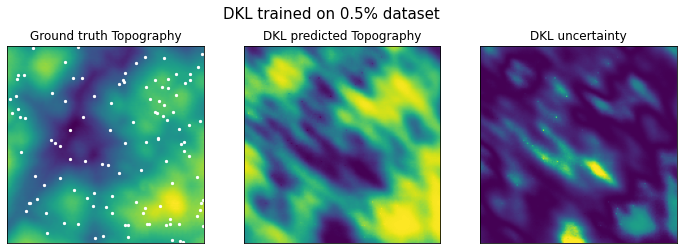

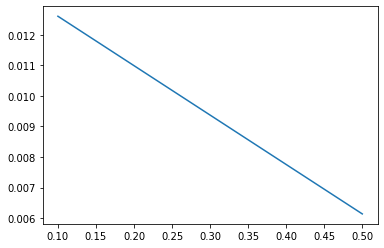

228
Epoch 1/200 ... Training loss: 0.756
Epoch 10/200 ... Training loss: 0.7241
Epoch 20/200 ... Training loss: 0.6872
Epoch 30/200 ... Training loss: 0.6489
Epoch 40/200 ... Training loss: 0.6095
Epoch 50/200 ... Training loss: 0.5691
Epoch 60/200 ... Training loss: 0.5274
Epoch 70/200 ... Training loss: 0.4841
Epoch 80/200 ... Training loss: 0.4397
Epoch 90/200 ... Training loss: 0.3941
Epoch 100/200 ... Training loss: 0.3476
Epoch 110/200 ... Training loss: 0.3004
Epoch 120/200 ... Training loss: 0.2529
Epoch 130/200 ... Training loss: 0.2048
Epoch 140/200 ... Training loss: 0.1561
Epoch 150/200 ... Training loss: 0.107
Epoch 160/200 ... Training loss: 0.0573
Epoch 170/200 ... Training loss: 0.0072
Epoch 180/200 ... Training loss: -0.0432
Epoch 190/200 ... Training loss: -0.0941
Epoch 200/200 ... Training loss: -0.1452


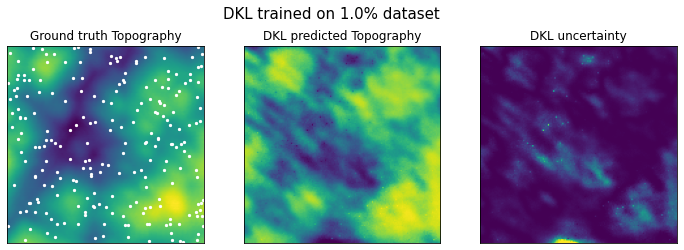

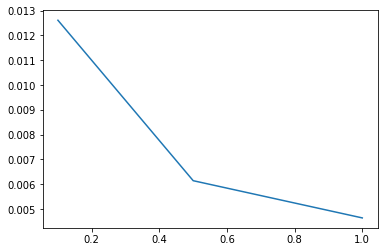

456
Epoch 1/200 ... Training loss: 0.7511
Epoch 10/200 ... Training loss: 0.719
Epoch 20/200 ... Training loss: 0.6821
Epoch 30/200 ... Training loss: 0.6437
Epoch 40/200 ... Training loss: 0.6039
Epoch 50/200 ... Training loss: 0.5621
Epoch 60/200 ... Training loss: 0.5196
Epoch 70/200 ... Training loss: 0.4759
Epoch 80/200 ... Training loss: 0.4313
Epoch 90/200 ... Training loss: 0.386
Epoch 100/200 ... Training loss: 0.3398
Epoch 110/200 ... Training loss: 0.293
Epoch 120/200 ... Training loss: 0.2456
Epoch 130/200 ... Training loss: 0.1975
Epoch 140/200 ... Training loss: 0.1488
Epoch 150/200 ... Training loss: 0.0995
Epoch 160/200 ... Training loss: 0.0497
Epoch 170/200 ... Training loss: -0.0005
Epoch 180/200 ... Training loss: -0.0512
Epoch 190/200 ... Training loss: -0.1023
Epoch 200/200 ... Training loss: -0.1536


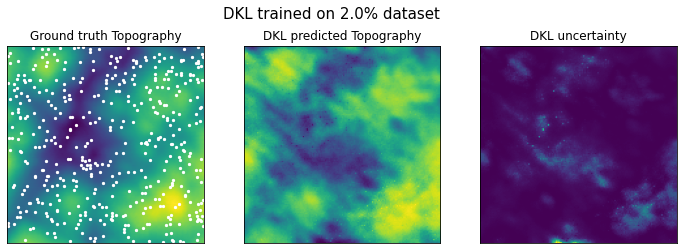

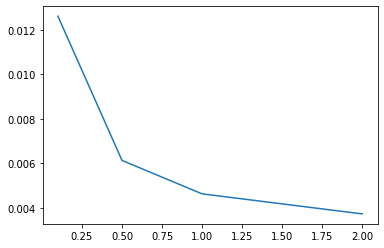

684
Epoch 1/200 ... Training loss: 0.7493
Epoch 10/200 ... Training loss: 0.7172
Epoch 20/200 ... Training loss: 0.68
Epoch 30/200 ... Training loss: 0.6403
Epoch 40/200 ... Training loss: 0.5994
Epoch 50/200 ... Training loss: 0.5578
Epoch 60/200 ... Training loss: 0.5154
Epoch 70/200 ... Training loss: 0.472
Epoch 80/200 ... Training loss: 0.4277
Epoch 90/200 ... Training loss: 0.3824
Epoch 100/200 ... Training loss: 0.3365
Epoch 110/200 ... Training loss: 0.2901
Epoch 120/200 ... Training loss: 0.243
Epoch 130/200 ... Training loss: 0.1949
Epoch 140/200 ... Training loss: 0.1461
Epoch 150/200 ... Training loss: 0.0967
Epoch 160/200 ... Training loss: 0.0469
Epoch 170/200 ... Training loss: -0.0034
Epoch 180/200 ... Training loss: -0.0542
Epoch 190/200 ... Training loss: -0.1053
Epoch 200/200 ... Training loss: -0.1568


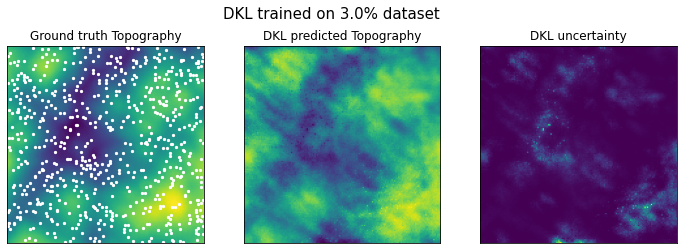

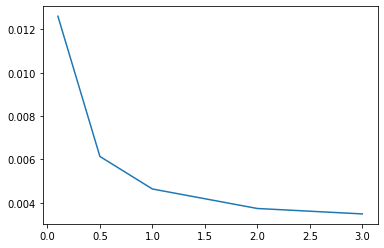

912
Epoch 1/200 ... Training loss: 0.7477
Epoch 10/200 ... Training loss: 0.7167
Epoch 20/200 ... Training loss: 0.6784
Epoch 30/200 ... Training loss: 0.6409
Epoch 40/200 ... Training loss: 0.6027
Epoch 50/200 ... Training loss: 0.5614
Epoch 60/200 ... Training loss: 0.5192
Epoch 70/200 ... Training loss: 0.4745
Epoch 80/200 ... Training loss: 0.4313
Epoch 90/200 ... Training loss: 0.3889
Epoch 100/200 ... Training loss: 0.3415
Epoch 110/200 ... Training loss: 0.2945
Epoch 120/200 ... Training loss: 0.2462
Epoch 130/200 ... Training loss: 0.198
Epoch 140/200 ... Training loss: 0.1556
Epoch 150/200 ... Training loss: 0.1068
Epoch 160/200 ... Training loss: 0.0554
Epoch 170/200 ... Training loss: 0.004
Epoch 180/200 ... Training loss: -0.0457
Epoch 190/200 ... Training loss: -0.092
Epoch 200/200 ... Training loss: -0.1468


/usr/local/lib/python3.7/dist-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  NumericalWarning,


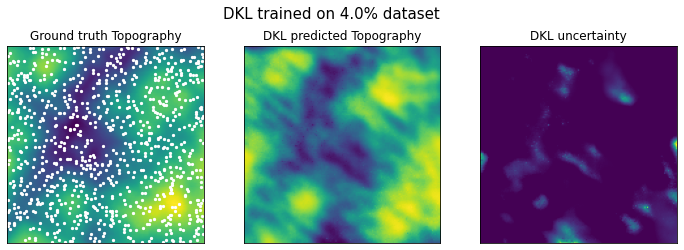

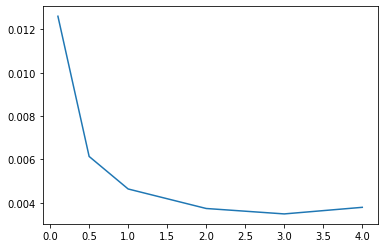

1140
Epoch 1/200 ... Training loss: 0.7478
Epoch 10/200 ... Training loss: 0.7184
Epoch 20/200 ... Training loss: 0.6774
Epoch 30/200 ... Training loss: 0.6411
Epoch 40/200 ... Training loss: 0.6015
Epoch 50/200 ... Training loss: 0.5571
Epoch 60/200 ... Training loss: 0.5157
Epoch 70/200 ... Training loss: 0.4727
Epoch 80/200 ... Training loss: 0.4296
Epoch 90/200 ... Training loss: 0.3856
Epoch 100/200 ... Training loss: 0.3407
Epoch 110/200 ... Training loss: 0.2938
Epoch 120/200 ... Training loss: 0.2449
Epoch 130/200 ... Training loss: 0.1972
Epoch 140/200 ... Training loss: 0.1523
Epoch 150/200 ... Training loss: 0.1026
Epoch 160/200 ... Training loss: 0.0533
Epoch 170/200 ... Training loss: 0.0034
Epoch 180/200 ... Training loss: -0.0473
Epoch 190/200 ... Training loss: -0.0973
Epoch 200/200 ... Training loss: -0.148


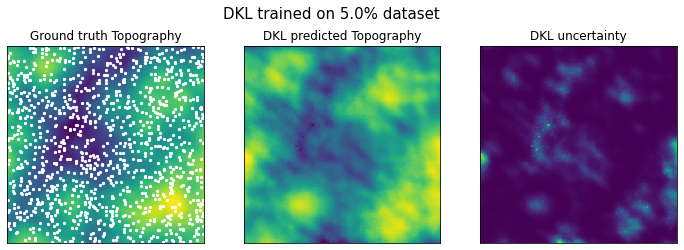

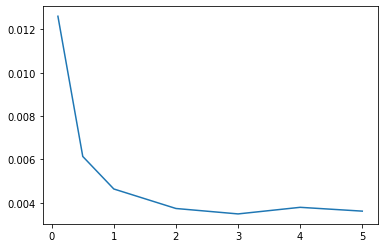

1368
Epoch 1/200 ... Training loss: 0.7468
Epoch 10/200 ... Training loss: 0.7166
Epoch 20/200 ... Training loss: 0.6749
Epoch 30/200 ... Training loss: 0.6367
Epoch 40/200 ... Training loss: 0.5969
Epoch 50/200 ... Training loss: 0.5561
Epoch 60/200 ... Training loss: 0.5149
Epoch 70/200 ... Training loss: 0.4725
Epoch 80/200 ... Training loss: 0.4297
Epoch 90/200 ... Training loss: 0.3849
Epoch 100/200 ... Training loss: 0.3406
Epoch 110/200 ... Training loss: 0.2957
Epoch 120/200 ... Training loss: 0.2464
Epoch 130/200 ... Training loss: 0.1996
Epoch 140/200 ... Training loss: 0.1512
Epoch 150/200 ... Training loss: 0.1041
Epoch 160/200 ... Training loss: 0.0545
Epoch 170/200 ... Training loss: 0.003
Epoch 180/200 ... Training loss: -0.0457
Epoch 190/200 ... Training loss: -0.0829
Epoch 200/200 ... Training loss: -0.1367


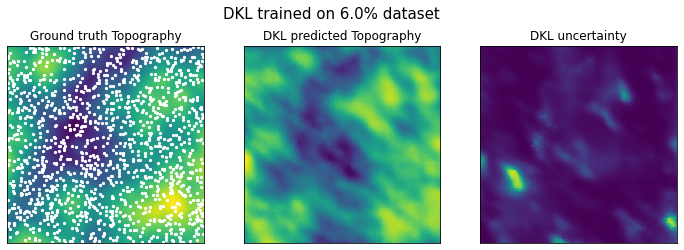

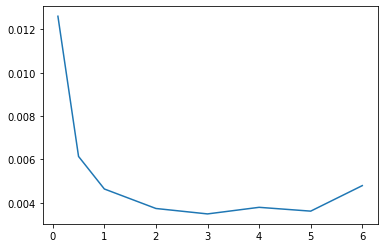

1824
Epoch 1/200 ... Training loss: 0.7461
Epoch 10/200 ... Training loss: 0.7158
Epoch 20/200 ... Training loss: 0.6778
Epoch 30/200 ... Training loss: 0.6401
Epoch 40/200 ... Training loss: 0.6008
Epoch 50/200 ... Training loss: 0.5604
Epoch 60/200 ... Training loss: 0.5199
Epoch 70/200 ... Training loss: 0.4792
Epoch 80/200 ... Training loss: 0.4355
Epoch 90/200 ... Training loss: 0.3893
Epoch 100/200 ... Training loss: 0.3434
Epoch 110/200 ... Training loss: 0.2965
Epoch 120/200 ... Training loss: 0.2474
Epoch 130/200 ... Training loss: 0.1993
Epoch 140/200 ... Training loss: 0.1521
Epoch 150/200 ... Training loss: 0.1046
Epoch 160/200 ... Training loss: 0.0544
Epoch 170/200 ... Training loss: 0.005
Epoch 180/200 ... Training loss: -0.0459
Epoch 190/200 ... Training loss: -0.0954
Epoch 200/200 ... Training loss: -0.1472


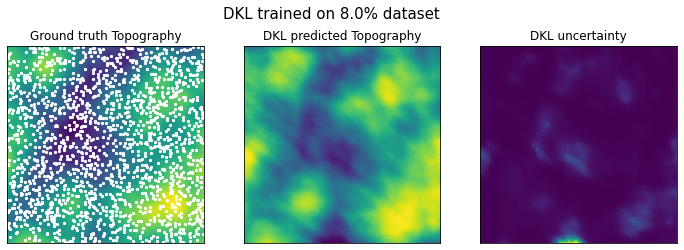

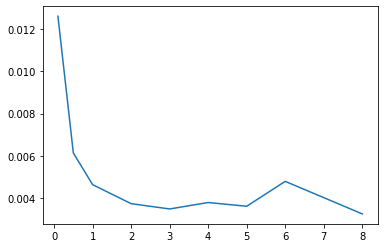

2280
Epoch 1/200 ... Training loss: 0.7458
Epoch 10/200 ... Training loss: 0.7103
Epoch 20/200 ... Training loss: 0.6717
Epoch 30/200 ... Training loss: 0.6331
Epoch 40/200 ... Training loss: 0.5937
Epoch 50/200 ... Training loss: 0.5532
Epoch 60/200 ... Training loss: 0.5118
Epoch 70/200 ... Training loss: 0.4693
Epoch 80/200 ... Training loss: 0.4258
Epoch 90/200 ... Training loss: 0.3811
Epoch 100/200 ... Training loss: 0.3358
Epoch 110/200 ... Training loss: 0.289
Epoch 120/200 ... Training loss: 0.2418
Epoch 130/200 ... Training loss: 0.1942
Epoch 140/200 ... Training loss: 0.1455
Epoch 150/200 ... Training loss: 0.0964
Epoch 160/200 ... Training loss: 0.0462
Epoch 170/200 ... Training loss: -0.0043
Epoch 180/200 ... Training loss: -0.0549
Epoch 190/200 ... Training loss: -0.1053
Epoch 200/200 ... Training loss: -0.1568


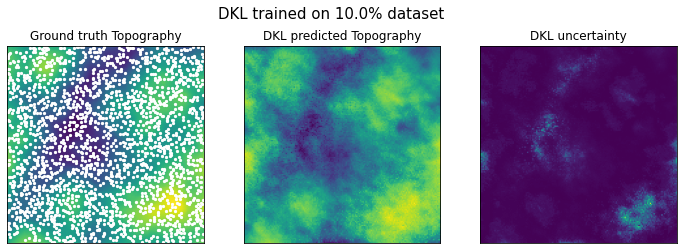

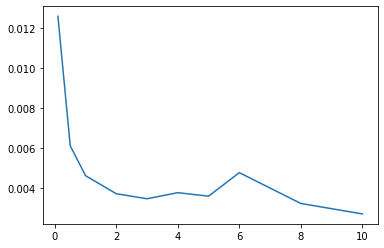

2736
Epoch 1/200 ... Training loss: 0.7456
Epoch 10/200 ... Training loss: 0.7114
Epoch 20/200 ... Training loss: 0.6722
Epoch 30/200 ... Training loss: 0.6334
Epoch 40/200 ... Training loss: 0.5937
Epoch 50/200 ... Training loss: 0.5532
Epoch 60/200 ... Training loss: 0.5117
Epoch 70/200 ... Training loss: 0.4692
Epoch 80/200 ... Training loss: 0.4254
Epoch 90/200 ... Training loss: 0.3806
Epoch 100/200 ... Training loss: 0.335
Epoch 110/200 ... Training loss: 0.2882
Epoch 120/200 ... Training loss: 0.2436
Epoch 130/200 ... Training loss: 0.1951
Epoch 140/200 ... Training loss: 0.1463
Epoch 150/200 ... Training loss: 0.0959
Epoch 160/200 ... Training loss: 0.0459
Epoch 170/200 ... Training loss: -0.0047
Epoch 180/200 ... Training loss: -0.0551
Epoch 190/200 ... Training loss: -0.1063
Epoch 200/200 ... Training loss: -0.1574


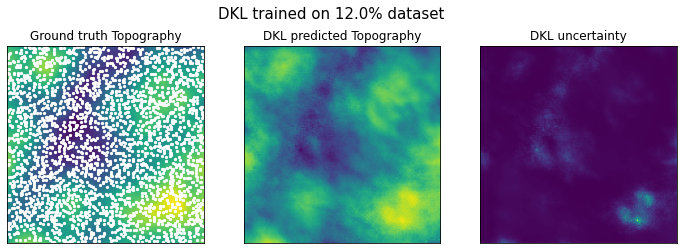

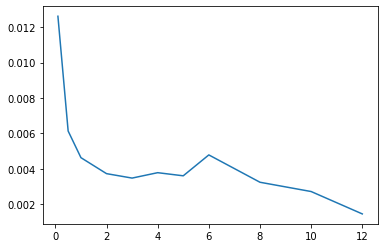

3420
Epoch 1/200 ... Training loss: 0.7452
Epoch 10/200 ... Training loss: 0.7088
Epoch 20/200 ... Training loss: 0.6718
Epoch 30/200 ... Training loss: 0.6331
Epoch 40/200 ... Training loss: 0.5932
Epoch 50/200 ... Training loss: 0.553
Epoch 60/200 ... Training loss: 0.5116
Epoch 70/200 ... Training loss: 0.4693
Epoch 80/200 ... Training loss: 0.4259
Epoch 90/200 ... Training loss: 0.3815
Epoch 100/200 ... Training loss: 0.3362
Epoch 110/200 ... Training loss: 0.29
Epoch 120/200 ... Training loss: 0.2443
Epoch 130/200 ... Training loss: 0.1968
Epoch 140/200 ... Training loss: 0.1469
Epoch 150/200 ... Training loss: 0.0974
Epoch 160/200 ... Training loss: 0.0476
Epoch 170/200 ... Training loss: -0.0028
Epoch 180/200 ... Training loss: -0.0543
Epoch 190/200 ... Training loss: -0.1052
Epoch 200/200 ... Training loss: -0.1569


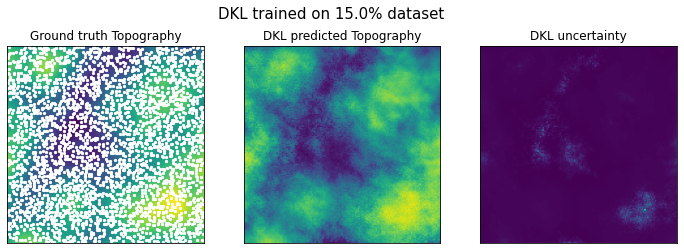

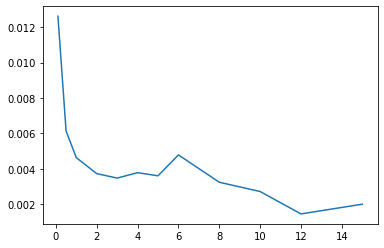

4104
Epoch 1/200 ... Training loss: 0.745
Epoch 10/200 ... Training loss: 0.7086
Epoch 20/200 ... Training loss: 0.671
Epoch 30/200 ... Training loss: 0.6324
Epoch 40/200 ... Training loss: 0.5929
Epoch 50/200 ... Training loss: 0.5524
Epoch 60/200 ... Training loss: 0.511
Epoch 70/200 ... Training loss: 0.4685
Epoch 80/200 ... Training loss: 0.4245
Epoch 90/200 ... Training loss: 0.38
Epoch 100/200 ... Training loss: 0.3341
Epoch 110/200 ... Training loss: 0.288
Epoch 120/200 ... Training loss: 0.241
Epoch 130/200 ... Training loss: 0.193
Epoch 140/200 ... Training loss: 0.1443
Epoch 150/200 ... Training loss: 0.0955
Epoch 160/200 ... Training loss: 0.0454
Epoch 170/200 ... Training loss: -0.0044
Epoch 180/200 ... Training loss: -0.055
Epoch 190/200 ... Training loss: -0.106
Epoch 200/200 ... Training loss: -0.1584


/usr/local/lib/python3.7/dist-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  NumericalWarning,


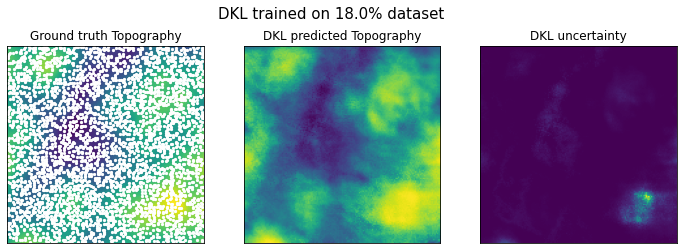

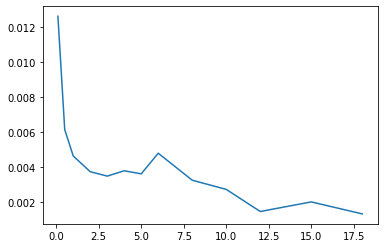

4560
Epoch 1/200 ... Training loss: 0.7449
Epoch 10/200 ... Training loss: 0.709
Epoch 20/200 ... Training loss: 0.6712
Epoch 30/200 ... Training loss: 0.6325
Epoch 40/200 ... Training loss: 0.5931
Epoch 50/200 ... Training loss: 0.5526
Epoch 60/200 ... Training loss: 0.5113
Epoch 70/200 ... Training loss: 0.4685
Epoch 80/200 ... Training loss: 0.4247
Epoch 90/200 ... Training loss: 0.3801
Epoch 100/200 ... Training loss: 0.3344
Epoch 110/200 ... Training loss: 0.2878
Epoch 120/200 ... Training loss: 0.2408
Epoch 130/200 ... Training loss: 0.1929
Epoch 140/200 ... Training loss: 0.144
Epoch 150/200 ... Training loss: 0.0948
Epoch 160/200 ... Training loss: 0.0449
Epoch 170/200 ... Training loss: -0.0035
Epoch 180/200 ... Training loss: -0.0556
Epoch 190/200 ... Training loss: -0.1063
Epoch 200/200 ... Training loss: -0.1586


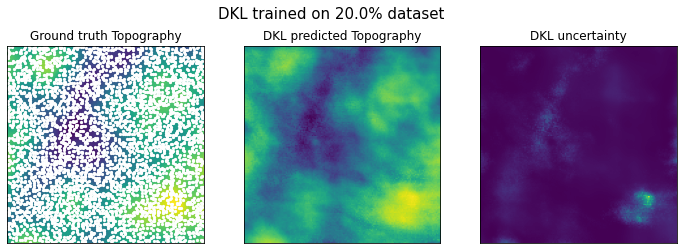

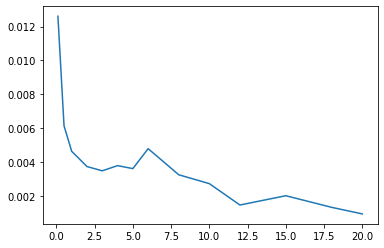

6840
Epoch 1/200 ... Training loss: 0.7446
Epoch 10/200 ... Training loss: 0.7085
Epoch 20/200 ... Training loss: 0.6711
Epoch 30/200 ... Training loss: 0.6324
Epoch 40/200 ... Training loss: 0.5927
Epoch 50/200 ... Training loss: 0.5521
Epoch 60/200 ... Training loss: 0.5105
Epoch 70/200 ... Training loss: 0.468
Epoch 80/200 ... Training loss: 0.4244
Epoch 90/200 ... Training loss: 0.3797
Epoch 100/200 ... Training loss: 0.3335
Epoch 110/200 ... Training loss: 0.2871
Epoch 120/200 ... Training loss: 0.2399
Epoch 130/200 ... Training loss: 0.1919
Epoch 140/200 ... Training loss: 0.1427
Epoch 150/200 ... Training loss: 0.0951
Epoch 160/200 ... Training loss: 0.0444
Epoch 170/200 ... Training loss: -0.0059
Epoch 180/200 ... Training loss: -0.0575
Epoch 190/200 ... Training loss: -0.1088
Epoch 200/200 ... Training loss: -0.1602


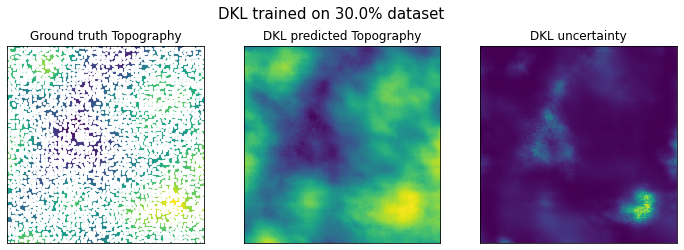

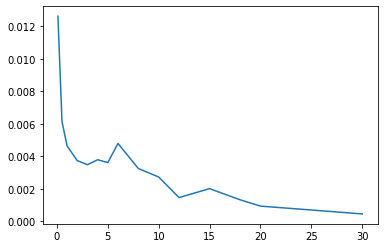

11400
Epoch 1/200 ... Training loss: 0.7444
Epoch 10/200 ... Training loss: 0.7073
Epoch 20/200 ... Training loss: 0.6698
Epoch 30/200 ... Training loss: 0.6311
Epoch 40/200 ... Training loss: 0.5916
Epoch 50/200 ... Training loss: 0.551
Epoch 60/200 ... Training loss: 0.5094
Epoch 70/200 ... Training loss: 0.4663
Epoch 80/200 ... Training loss: 0.4225
Epoch 90/200 ... Training loss: 0.3819
Epoch 100/200 ... Training loss: 0.3351
Epoch 110/200 ... Training loss: 0.2879
Epoch 120/200 ... Training loss: 0.2404
Epoch 130/200 ... Training loss: 0.1918
Epoch 140/200 ... Training loss: 0.143
Epoch 150/200 ... Training loss: 0.096
Epoch 160/200 ... Training loss: 0.0451
Epoch 170/200 ... Training loss: -0.0056
Epoch 180/200 ... Training loss: -0.0567
Epoch 190/200 ... Training loss: -0.1081
Epoch 200/200 ... Training loss: -0.1595


/usr/local/lib/python3.7/dist-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  NumericalWarning,


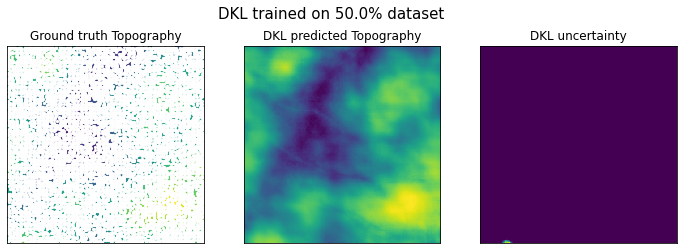

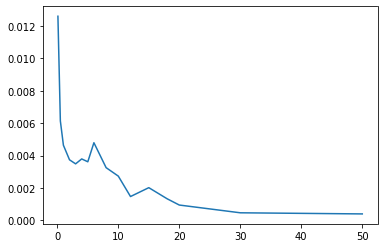

18240
Epoch 1/200 ... Training loss: 0.7442
Epoch 10/200 ... Training loss: 0.7071
Epoch 20/200 ... Training loss: 0.6694
Epoch 30/200 ... Training loss: 0.6308
Epoch 40/200 ... Training loss: 0.5912
Epoch 50/200 ... Training loss: 0.5508
Epoch 60/200 ... Training loss: 0.5092
Epoch 70/200 ... Training loss: 0.4661
Epoch 80/200 ... Training loss: 0.424
Epoch 90/200 ... Training loss: 0.378
Epoch 100/200 ... Training loss: 0.3355
Epoch 110/200 ... Training loss: 0.2889
Epoch 120/200 ... Training loss: 0.2414
Epoch 130/200 ... Training loss: 0.1933
Epoch 140/200 ... Training loss: 0.1445
Epoch 150/200 ... Training loss: 0.095
Epoch 160/200 ... Training loss: 0.045
Epoch 170/200 ... Training loss: -0.0054
Epoch 180/200 ... Training loss: -0.0564
Epoch 190/200 ... Training loss: -0.1071
Epoch 200/200 ... Training loss: -0.1589


/usr/local/lib/python3.7/dist-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  NumericalWarning,


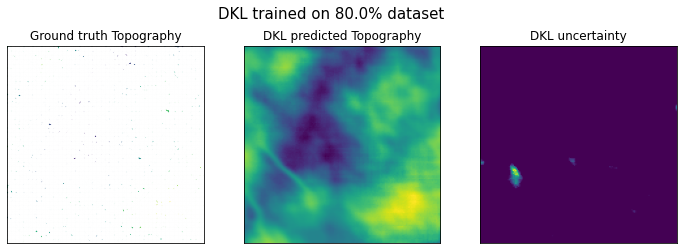

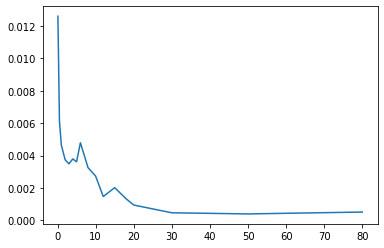

22801
Epoch 1/200 ... Training loss: 0.7442
Epoch 10/200 ... Training loss: 0.7069
Epoch 20/200 ... Training loss: 0.6691
Epoch 30/200 ... Training loss: 0.6306
Epoch 40/200 ... Training loss: 0.5911
Epoch 50/200 ... Training loss: 0.5505
Epoch 60/200 ... Training loss: 0.5088
Epoch 70/200 ... Training loss: 0.4662
Epoch 80/200 ... Training loss: 0.4229
Epoch 90/200 ... Training loss: 0.3782
Epoch 100/200 ... Training loss: 0.3325
Epoch 110/200 ... Training loss: 0.2862
Epoch 120/200 ... Training loss: 0.2391
Epoch 130/200 ... Training loss: 0.1911
Epoch 140/200 ... Training loss: 0.1427
Epoch 150/200 ... Training loss: 0.0937
Epoch 160/200 ... Training loss: 0.0438
Epoch 170/200 ... Training loss: -0.0064
Epoch 180/200 ... Training loss: -0.0572
Epoch 190/200 ... Training loss: -0.1081
Epoch 200/200 ... Training loss: -0.1596


/usr/local/lib/python3.7/dist-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  NumericalWarning,


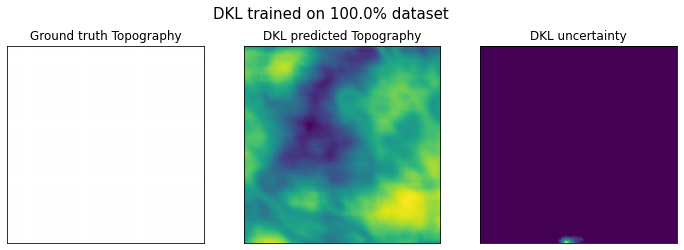

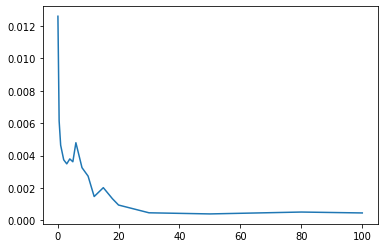

In [ ]:
for i in range(len(perct)):
  #randomly pick point
  tl_sz = int(y.shape[0])
  percent = perct[i]     # select perct % of full data
  sz = int(tl_sz*percent/100)
  print(sz)
  idx = np.random.choice(range(tl_sz), sz, replace=False)

  X_train = X[idx]
  y_train = y[idx]
  indices_train = indices_all[idx,:]

  data_dim = X.shape[-1]

  dklgp = dklGPR(data_dim, embedim=2, precision="single")
  dklgp.fit(X_train, y_train, training_cycles=200)

  mean, var = dklgp.predict(X, batch_size=len(X))

  f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
  f.suptitle ("DKL trained on {}% dataset".format(percent), fontsize = 15)
  ax1.imshow(y.reshape(pix, pix), origin = "lower")
  ax1.scatter(indices_train[:,1]-ps, indices_train[:,0]-ps, c = 'white', s = 5)
  ax1.set_title("Ground truth Topography")
  plt.setp(ax1.get_xticklabels(), visible=False)
  plt.setp(ax1.get_yticklabels(), visible=False)
  ax1.tick_params(axis='both', which='both', length=0)

  ax2.imshow(mean.reshape(pix,pix), origin = "lower")
  ax2.set_title("DKL predicted Topography")
  plt.setp(ax2.get_xticklabels(), visible=False)
  plt.setp(ax2.get_yticklabels(), visible=False)
  ax2.tick_params(axis='both', which='both', length=0)

  ax3.imshow(var.reshape(pix, pix), origin = "lower")
  ax3.set_title("DKL uncertainty")
  plt.setp(ax3.get_xticklabels(), visible=False)
  plt.setp(ax3.get_yticklabels(), visible=False)
  ax3.tick_params(axis='both', which='both', length=0)

  plt.show()

  MSE = np.append(MSE, mean_squared_error(y, mean))

  plt.plot(perct[:len(MSE)], MSE)
  plt.show()


Text(0, 0.5, 'Mean Squared Error')

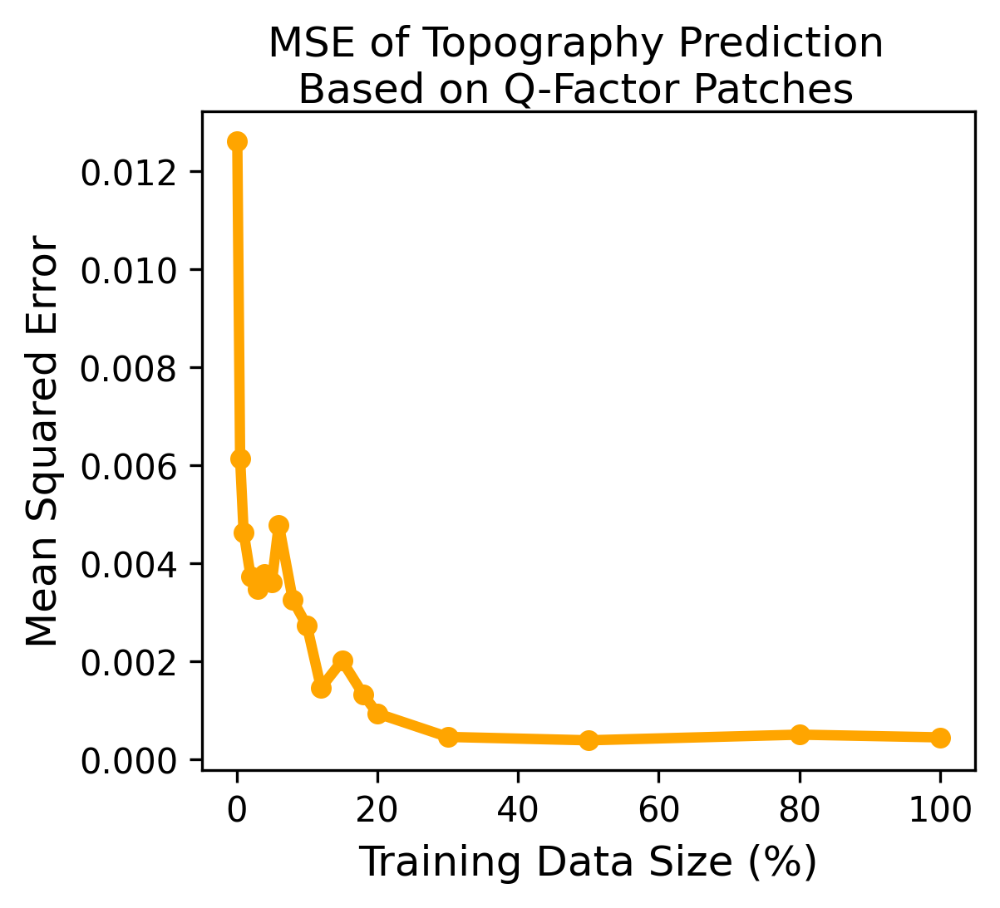

In [ ]:
f, ax = plt.subplots(figsize = (4,3.5), dpi= 300)
f.suptitle ("MSE of Topography Prediction\nBased on Q-Factor Patches")
ax.plot(perct, MSE, c = "orange", marker = "o", markersize = 5, linewidth = 3)
ax.set_xlabel("Training Data Size (%)", fontsize=12)
ax.set_ylabel("Mean Squared Error", fontsize=12)